# VAE Demo

## Load Libraries

In [1]:
import torch
import torch.optim as optim
from torchvision import datasets
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

/home/tw17/.local/lib/python3.10/site-packages/transformers/utils/generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


## Load Utils

In [2]:
from models.vae_train import train_vae
from models.utils import show_images

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Load Loss

In [4]:
from models.vae_loss import vae_loss

## LNN-based VAE

### Load Model

In [5]:
from models.vae import LNN_VAE

### Load Data

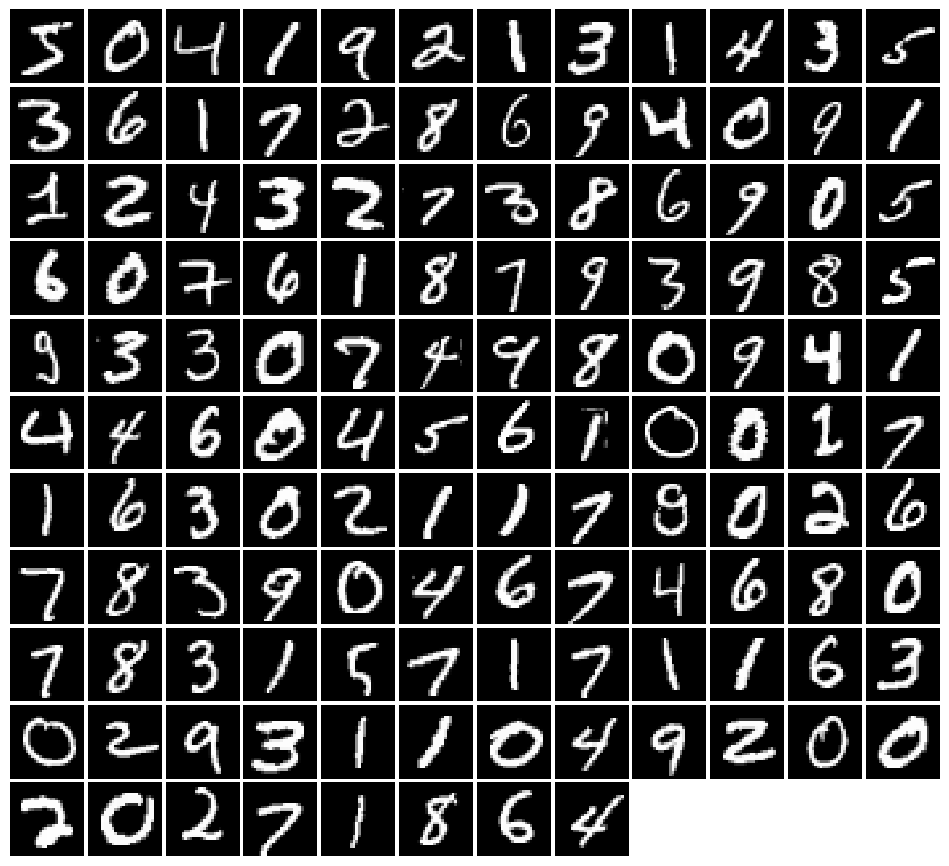

In [6]:
batch_size = 128

mnist = datasets.MNIST('./data', train=True, download=True, transform=transforms.ToTensor())
train_loader = DataLoader(mnist, batch_size=batch_size, drop_last=True)

try:
  imgs = next(iter(train_loader))[0].view(batch_size, 784).numpy().squeeze()
except:
  imgs = train_loader.__iter__().next()[0].view(batch_size, 784).numpy().squeeze()

show_images(imgs)

### Train Model

EPOCH: 1
Iter: 0, loss: 6.959e+04


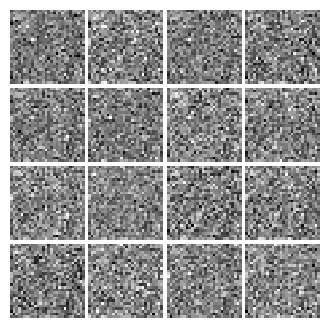


EPOCH: 2
Iter: 500, loss: 1.748e+04


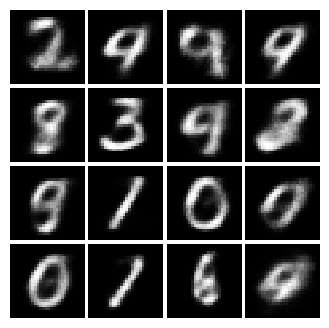


EPOCH: 3
Iter: 1000, loss: 1.624e+04


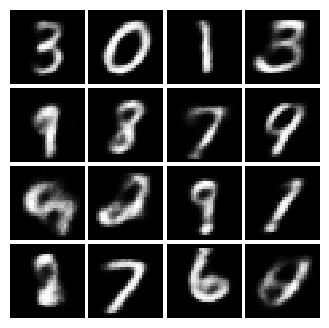


EPOCH: 4
Iter: 1500, loss: 1.527e+04


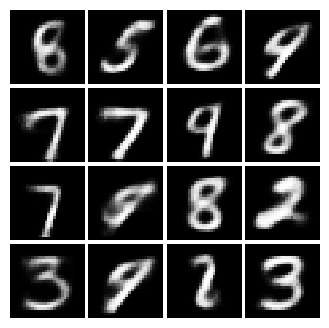


EPOCH: 5
Iter: 2000, loss: 1.388e+04


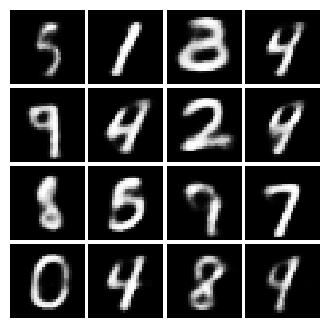


EPOCH: 6
Iter: 2500, loss: 1.395e+04


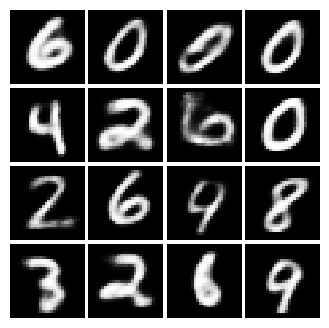


EPOCH: 7
Iter: 3000, loss: 1.431e+04


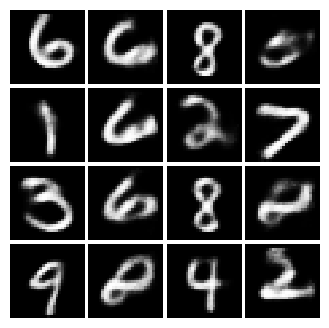


EPOCH: 8
Iter: 3500, loss: 1.409e+04


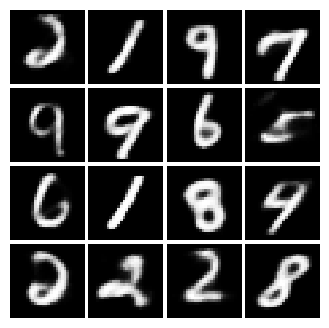


EPOCH: 9
Iter: 4000, loss: 1.36e+04


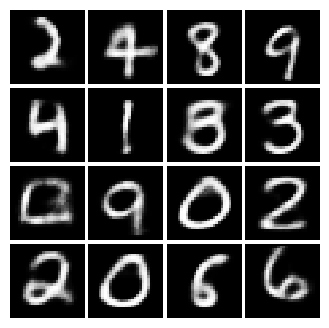


EPOCH: 10
Iter: 4500, loss: 1.369e+04


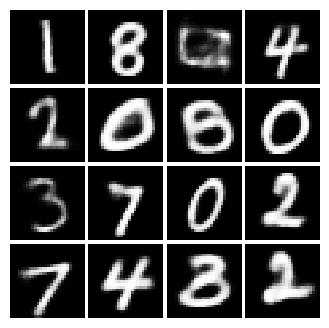

In [7]:
vae = LNN_VAE(input_channels=1, image_size=28).to(device)

vae_optimizer = optim.Adam(vae.parameters(), lr=1e-3, betas=(0.5, 0.999))

train_vae(vae, vae_optimizer, vae_loss, show_every=500, train_loader=train_loader, num_epochs=10, device=device)

## CNN-based VAE

### Load Model

In [8]:
from models.vae import CNN_VAE

### Load Data

In [9]:
batch_size = 64
image_size = 64
cat_root = './data/cats'

cat_train = ImageFolder(root=cat_root, transform=transforms.Compose([
  transforms.ToTensor(),
  transforms.Resize(int(1.15 * image_size), antialias=True),
  transforms.RandomCrop(image_size),
  transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
]))

cat_train_loader = DataLoader(cat_train, batch_size=batch_size, drop_last=True)

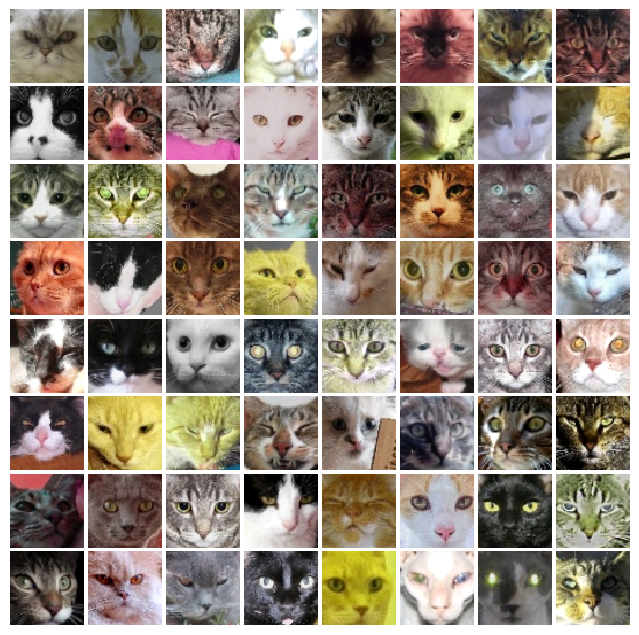

In [10]:
try:
  imgs = next(iter(cat_train_loader))[0].numpy().squeeze()
except:
  imgs = cat_train_loader.__iter__().next()[0].numpy().squeeze()

show_images(imgs, color=True)

### Train Model

EPOCH: 1
Iter: 0, loss: 5.459e+05


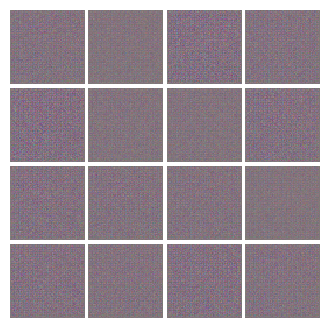


EPOCH: 2
Iter: 250, loss: 4.577e+05


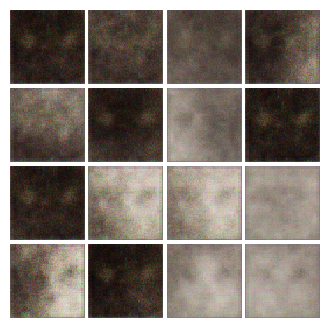


EPOCH: 3
Iter: 500, loss: 4.597e+05


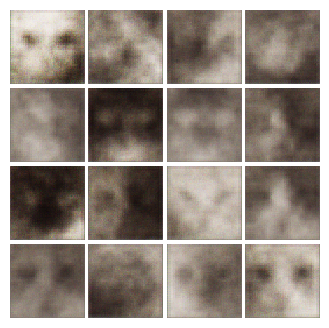


EPOCH: 4
Iter: 750, loss: 4.652e+05


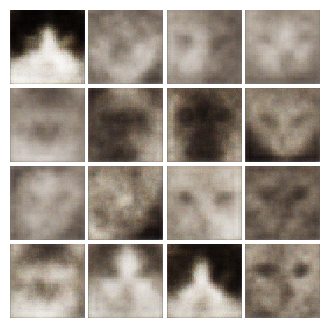


EPOCH: 5
Iter: 1000, loss: 4.481e+05


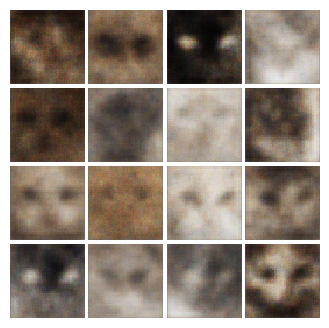


EPOCH: 6
Iter: 1250, loss: 4.387e+05


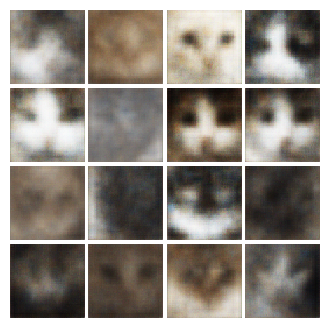


EPOCH: 7
Iter: 1500, loss: 4.519e+05


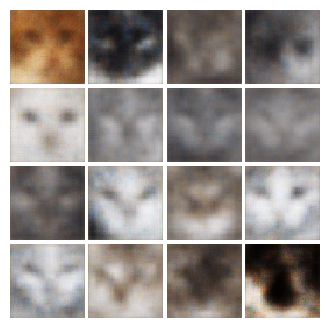


EPOCH: 8
Iter: 1750, loss: 4.279e+05


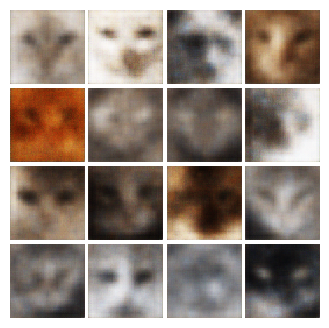


EPOCH: 9
Iter: 2000, loss: 4.52e+05


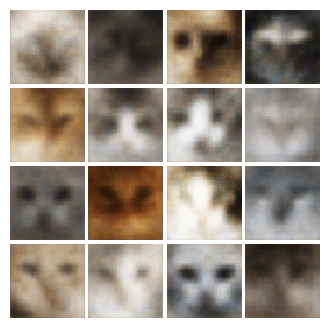


EPOCH: 10
Iter: 2250, loss: 4.576e+05


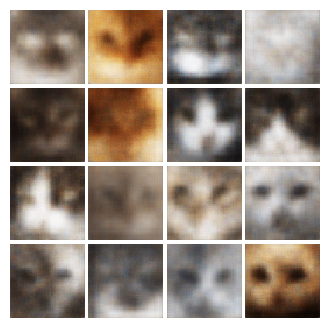


EPOCH: 11
Iter: 2500, loss: 4.416e+05


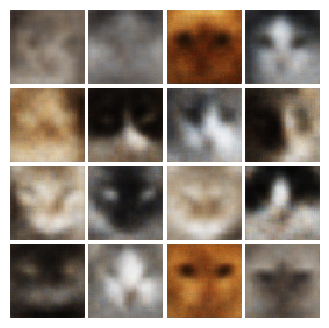


EPOCH: 12
Iter: 2750, loss: 4.342e+05


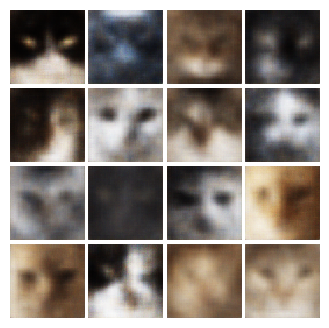


EPOCH: 13
Iter: 3000, loss: 4.304e+05


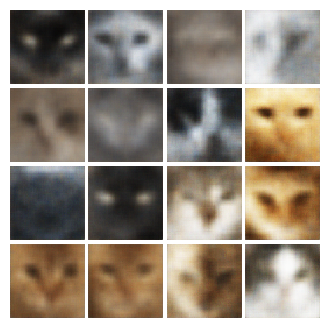


EPOCH: 14
Iter: 3250, loss: 4.557e+05


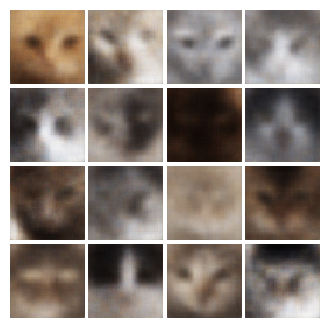


EPOCH: 15
Iter: 3500, loss: 4.332e+05


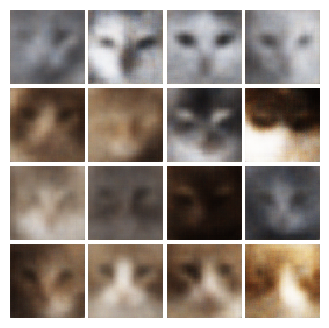


EPOCH: 16
Iter: 3750, loss: 4.387e+05


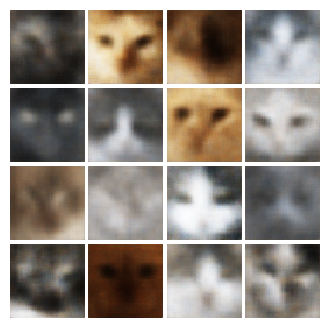


EPOCH: 17
Iter: 4000, loss: 4.491e+05


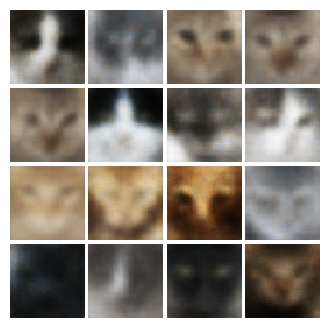


EPOCH: 18
Iter: 4250, loss: 4.467e+05


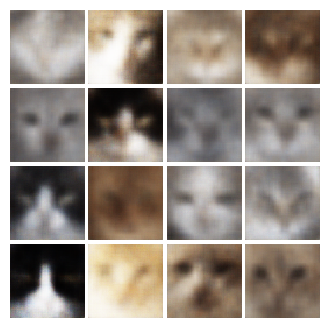


EPOCH: 19
Iter: 4500, loss: 4.519e+05


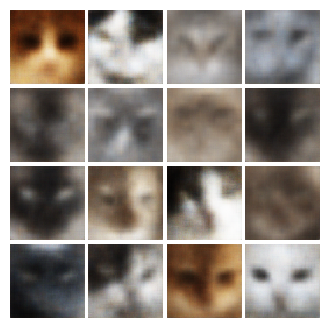


EPOCH: 20
Iter: 4750, loss: 4.386e+05


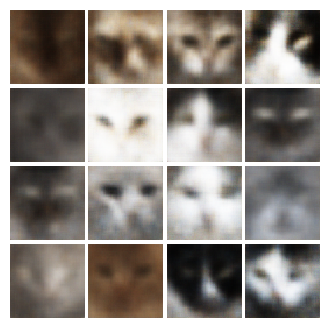


EPOCH: 21
Iter: 5000, loss: 4.392e+05


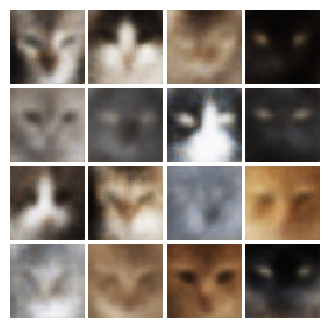


EPOCH: 22
Iter: 5250, loss: 4.609e+05


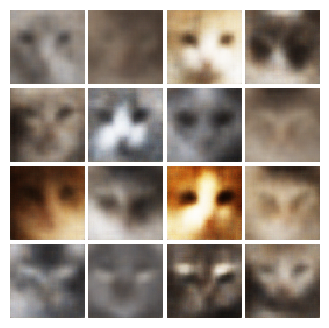


EPOCH: 23
Iter: 5500, loss: 4.335e+05


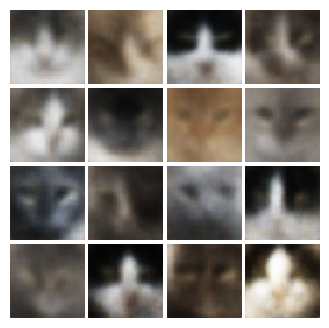


EPOCH: 24
Iter: 5750, loss: 4.472e+05


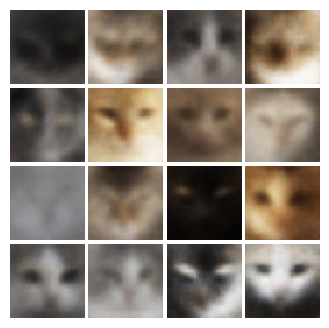


EPOCH: 25
Iter: 6000, loss: 4.583e+05


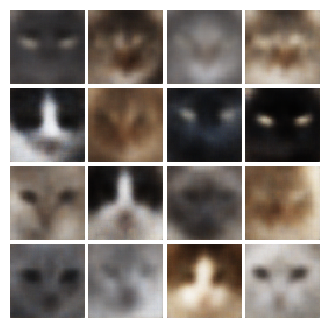


EPOCH: 26
Iter: 6250, loss: 4.215e+05


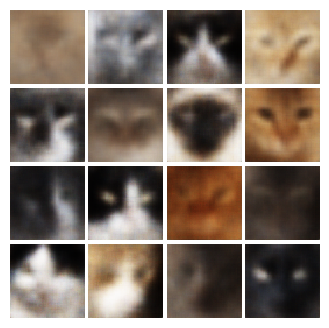


EPOCH: 27
Iter: 6500, loss: 4.624e+05


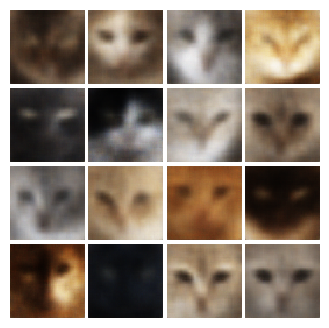


EPOCH: 28
Iter: 6750, loss: 4.289e+05


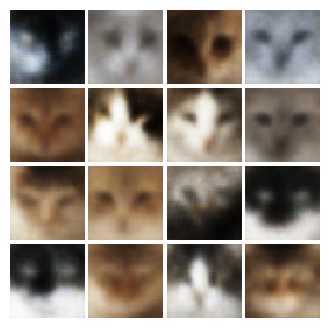


EPOCH: 29
Iter: 7000, loss: 4.583e+05


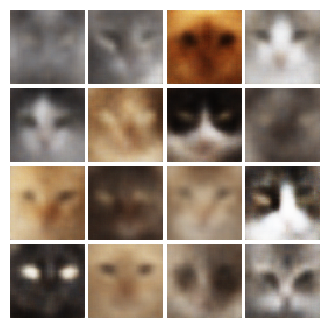


EPOCH: 30
Iter: 7250, loss: 4.55e+05


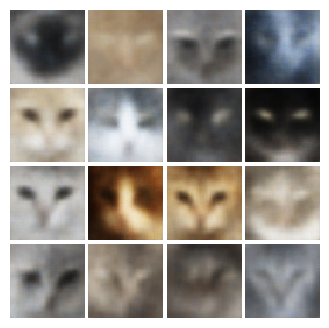


EPOCH: 31
Iter: 7500, loss: 4.3e+05


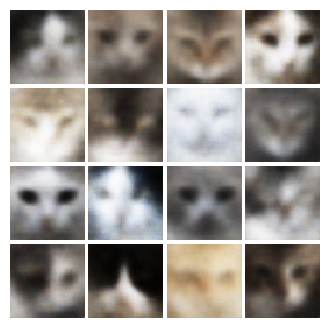


EPOCH: 32
Iter: 7750, loss: 4.501e+05


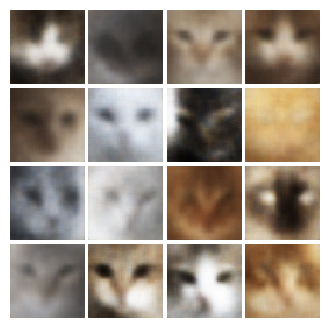


EPOCH: 33
Iter: 8000, loss: 4.496e+05


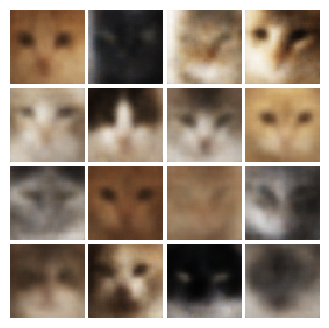


EPOCH: 34
Iter: 8250, loss: 4.608e+05


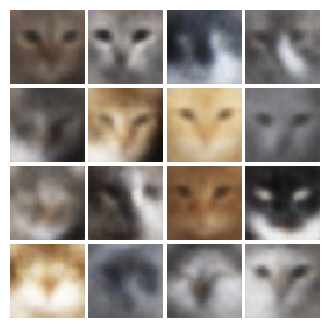


EPOCH: 35
Iter: 8500, loss: 4.445e+05


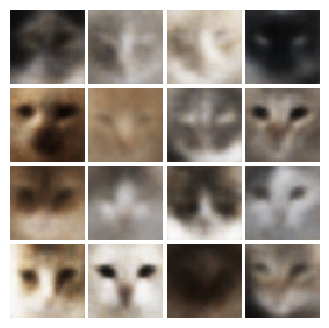


EPOCH: 36
Iter: 8750, loss: 4.301e+05


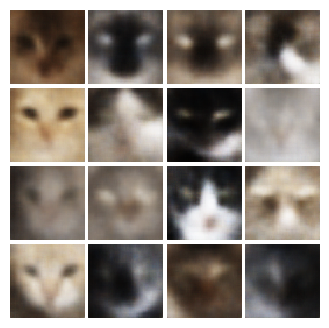


EPOCH: 37
Iter: 9000, loss: 4.624e+05


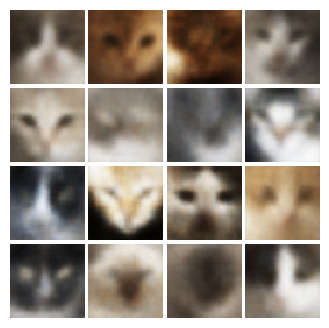


EPOCH: 38
Iter: 9250, loss: 4.459e+05


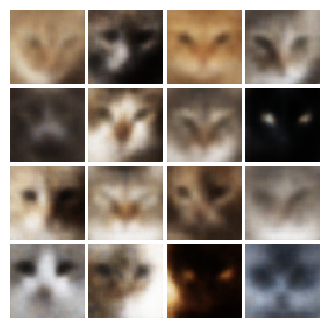


EPOCH: 39
Iter: 9500, loss: 4.675e+05


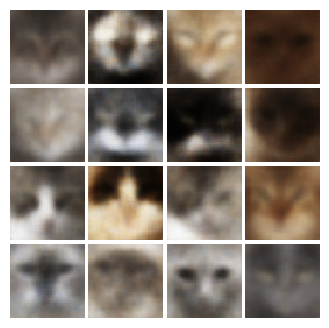


EPOCH: 40
Iter: 9750, loss: 4.459e+05


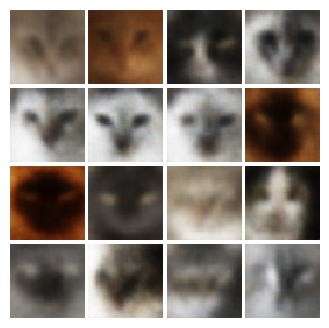


EPOCH: 41
Iter: 10000, loss: 4.491e+05


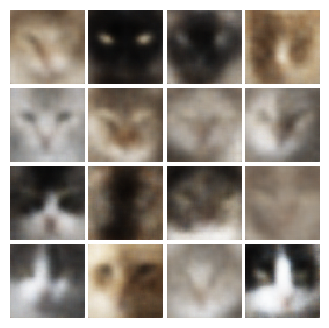


EPOCH: 42
Iter: 10250, loss: 4.474e+05


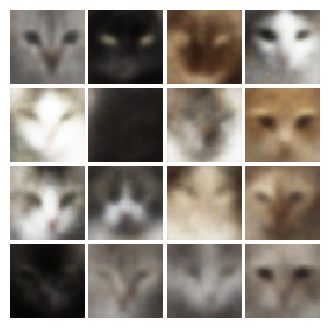


EPOCH: 43
Iter: 10500, loss: 4.504e+05


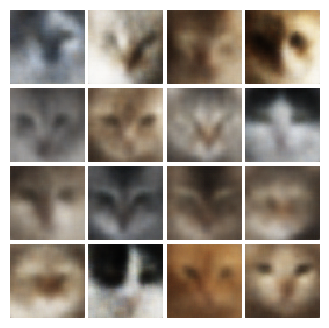


EPOCH: 44
Iter: 10750, loss: 4.443e+05


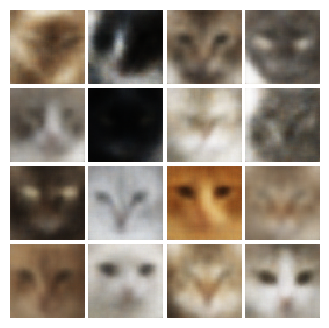


EPOCH: 45
Iter: 11000, loss: 4.402e+05


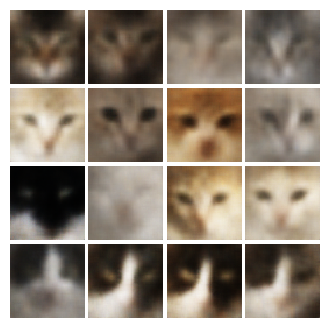


EPOCH: 46
Iter: 11250, loss: 4.511e+05


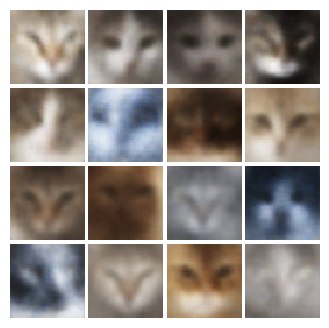


EPOCH: 47
Iter: 11500, loss: 4.378e+05


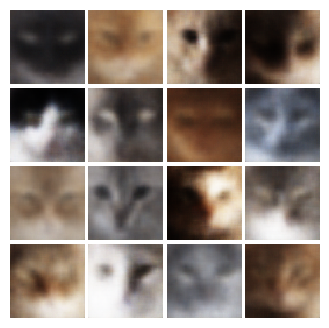


EPOCH: 48
Iter: 11750, loss: 4.461e+05


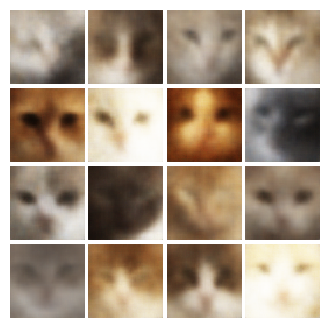


EPOCH: 49
Iter: 12000, loss: 4.606e+05


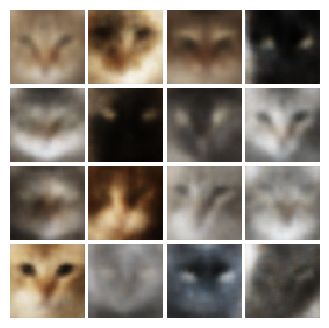


EPOCH: 50
Iter: 12250, loss: 4.579e+05


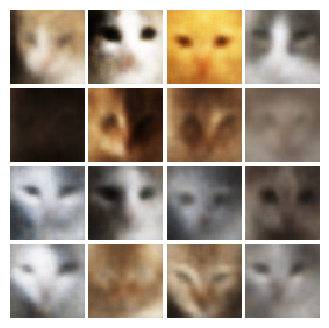

In [11]:
vae = CNN_VAE(input_channels=3, image_size=64).to(device)

vae_optimizer = optim.Adam(vae.parameters(), lr=1e-4, betas=(0.5, 0.999))

train_vae(vae, vae_optimizer, vae_loss, show_every=250, train_loader=cat_train_loader, num_epochs=50, device=device)